<a href="https://colab.research.google.com/github/UrkoAlliBarrena/PRACTICA_TEMA5_Urko/blob/main/Dataset_Segmentacion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Instance Segmentation** using YOLO11

In [9]:
# Check GPU (No free GPU available right now)
!nvidia-smi


NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968

In [2]:

# Install the necessary libraries
!pip install ultralytics roboflow opencv-python pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.1/83.1 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 86.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

import zipfile
dataset_path = '/content/drive/MyDrive/TFG/Dataset.zip'
with zipfile.ZipFile(dataset_path, 'r') as zip_ref:
    zip_ref.extractall('/content/Dataset')

Mounted at /content/drive


In [ ]:
# *** Change path in data.yaml file for Google Colab ***
# path: /content/Fire-and-Smoke-Segmentation-4
# test: test/images    # relative to 'path'
# train: train/images  # relative to 'path'
# val: valid/images    # relative to 'path'


In [8]:
# Train the YOLO11 model
from ultralytics import YOLO
import os

# Path to the data.yaml file
data_yaml_path = '/content/Dataset/Dataset/dataset.yaml'

# Initialize the YOLO11 model - using the nano model for speed
model = YOLO('yolo11n-seg.pt')  # Load a pretrained YOLO11 model

# Train the model
model.train(task='segment', mode='train', data=data_yaml_path, epochs=10) # task and mode are optional parameters

# Train using CLI (In this project all python code is used instead of CLI)
# !yolo task=segment mode=train model=yolo11n-seg.pt data=data_yaml_path epochs=10


Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/Dataset/Dataset/train/images, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf

RuntimeError: Dataset '/content/Dataset/Dataset/train/images' error ❌ [Errno 21] Is a directory: '/content/Dataset/Dataset/train/images'

In [ ]:
# Validate the model
metrics = model.val()

# Print the evaluation metrics
print("Model Evaluation Metrics:", metrics)


Ultralytics 8.3.2 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,958 parameters, 0 gradients, 10.2 GFLOPs


val: Scanning /content/Fire-and-Smoke-Segmentation-4/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.43it/s]


                   all         40         97      0.887      0.499       0.64      0.424      0.872      0.499       0.62      0.397
                  fire         40         58      0.846      0.672       0.77       0.57      0.868       0.69      0.801      0.553
                 smoke         28         39      0.927      0.326      0.509      0.278      0.876      0.308      0.439      0.241
Speed: 0.5ms preprocess, 19.6ms inference, 0.0ms loss, 6.4ms postprocess per image
Results saved to runs/segment/train2
Model Evaluation Metrics: ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ac4b87cf0d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([     

In [ ]:
# Export the model
# model.export(format='onnx')  # You can choose 'tflite', 'torchscript', etc.


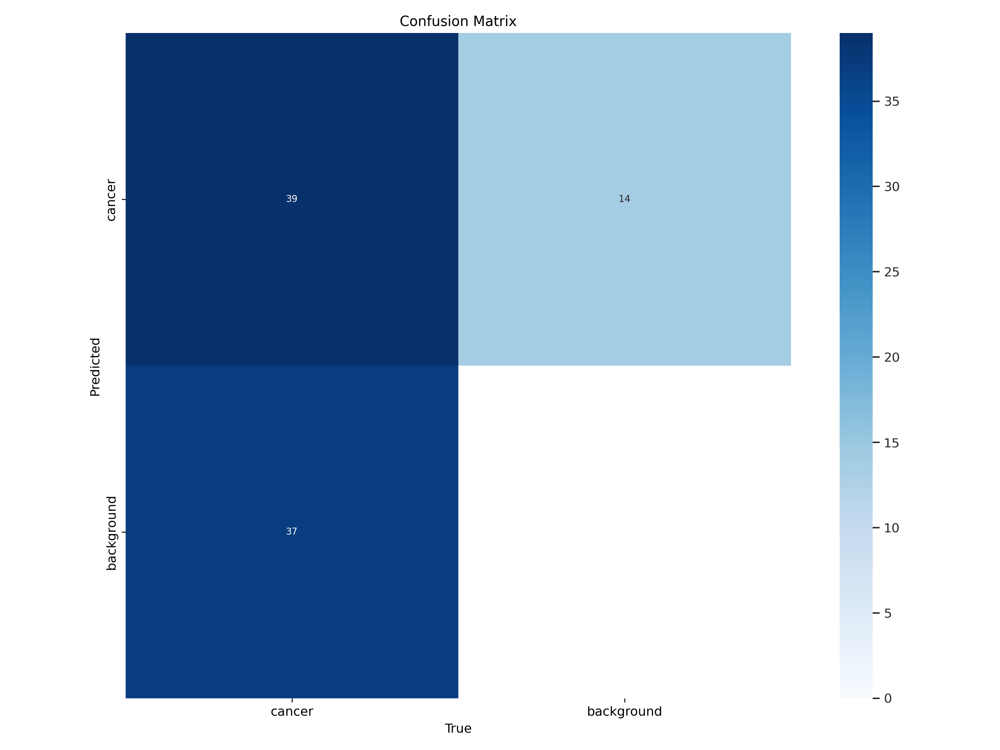

In [ ]:
# Show Confusion Matrix
from IPython.display import Image, display
display(Image('/content/runs/segment/train/confusion_matrix.png'))


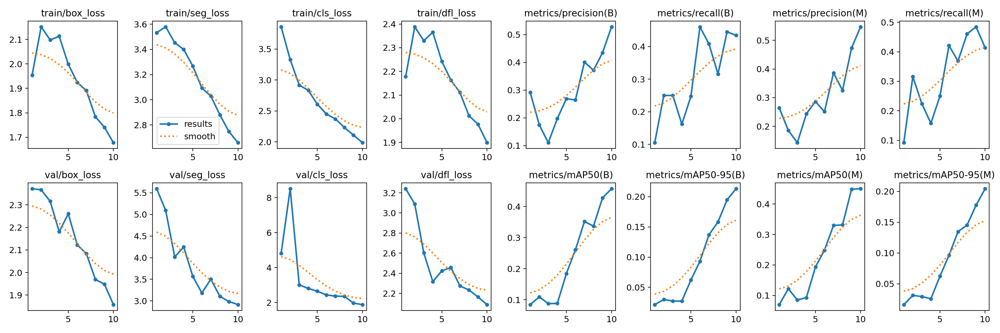

In [ ]:
# Show Results (image)
display(Image('/content/runs/segment/train/results.png'))


In [ ]:
# Show results (table)
import pandas as pd

# Load the CSV file into a pandas DataFrame
csv_file_path = '/content/runs/segment/train/results.csv'
df = pd.read_csv(csv_file_path)

# Display the DataFrame
print(df)


   epoch      time  train/box_loss  train/seg_loss  train/cls_loss  \
0      1   57.7185         1.95423         3.53262         3.86088   
1      2  102.8530         2.15167         3.57923         3.32894   
2      3  148.2150         2.09771         3.45315         2.91704   
3      4  194.7360         2.11320         3.39860         2.83346   
4      5  240.5180         1.99876         3.26669         2.60860   
5      6  284.0220         1.92424         3.09344         2.45056   
6      7  329.5190         1.89123         3.02827         2.36980   
7      8  372.6890         1.78399         2.87927         2.23177   
8      9  417.1080         1.74109         2.74690         2.10783   
9     10  462.8470         1.67804         2.65859         1.98612   

   train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0         2.17819               0.29184            0.10526           0.08440   
1         2.38843               0.17526            0.25000           

In [ ]:
# Package imports and train path
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_path = '/content/runs/segment/train'


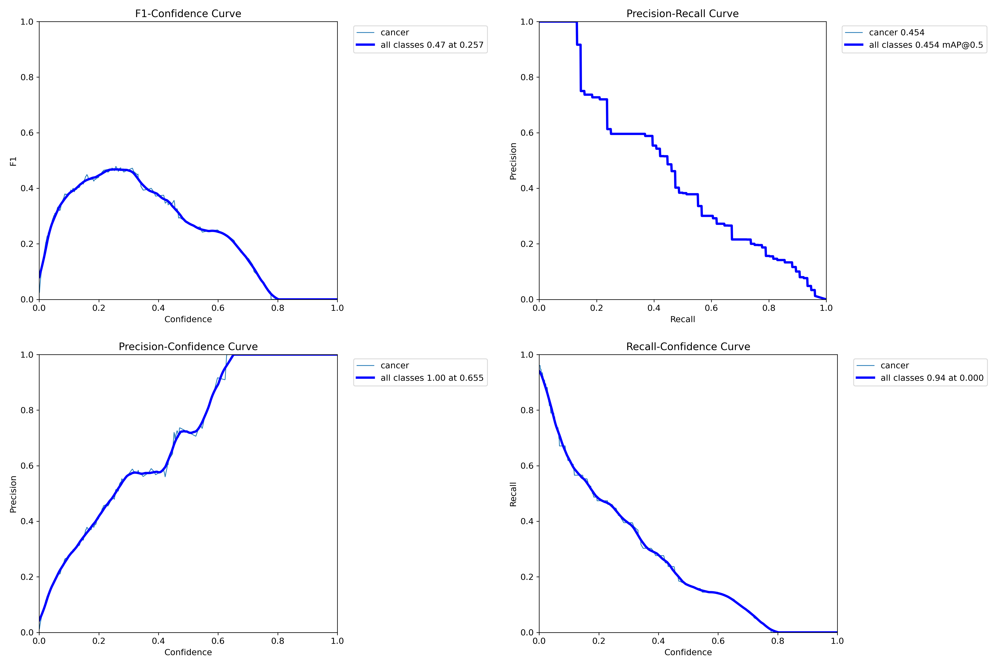

In [ ]:
# Show box curves of F1-Confident, Precision-Recall, Precision-Confident and Recall-Confident

# Load your images using OpenCV
img1 = cv2.imread(f'{train_path}/BoxF1_curve.png')
img2 = cv2.imread(f'{train_path}/BoxPR_curve.png')
img3 = cv2.imread(f'{train_path}/BoxP_curve.png')
img4 = cv2.imread(f'{train_path}/BoxR_curve.png')

# Concatenate images horizontally
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenate the two rows vertically
grid = cv2.vconcat([top_row, bottom_row])

# Display the concatenated image
cv2_imshow(grid)


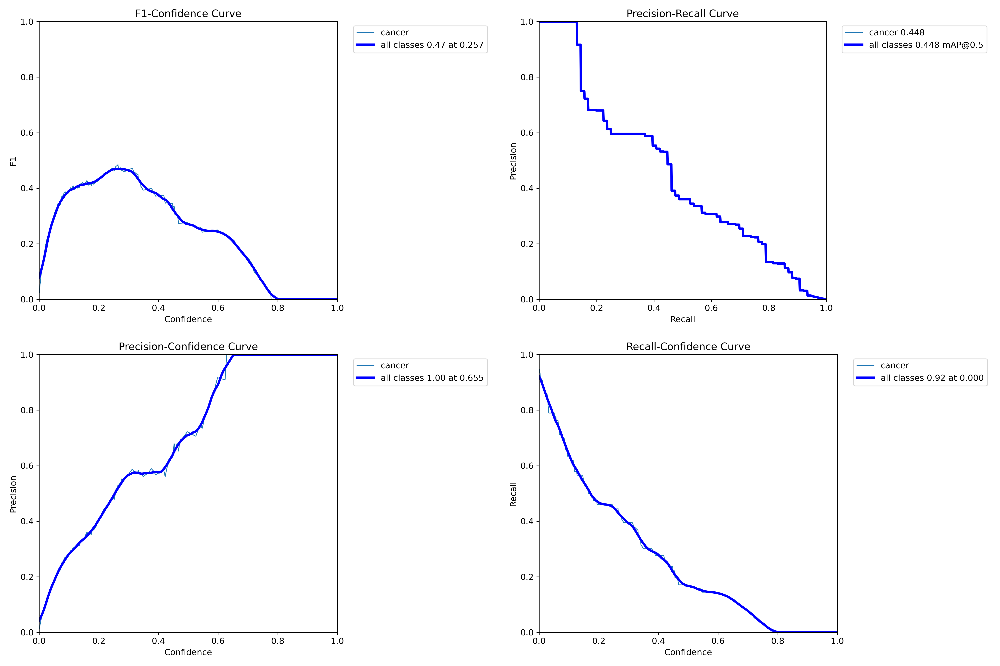

In [ ]:
# Show mask curves of F1-Confident, Precision-Recall, Precision-Confident and Recall-Confident

# Load your images using OpenCV
img1 = cv2.imread(f'{train_path}/MaskF1_curve.png')
img2 = cv2.imread(f'{train_path}/MaskPR_curve.png')
img3 = cv2.imread(f'{train_path}/MaskP_curve.png')
img4 = cv2.imread(f'{train_path}/MaskR_curve.png')

# Concatenate images horizontally
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenate the two rows vertically
grid = cv2.vconcat([top_row, bottom_row])

# Display the concatenated image
cv2_imshow(grid)


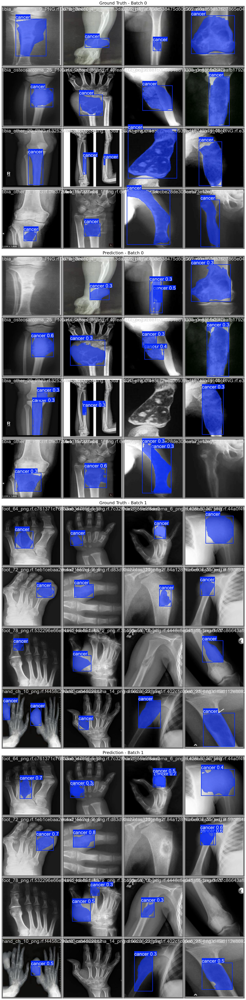

In [ ]:
# Validation Results: Ground Truth vs Prediction

# Load your images using matplotlib's imread
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')

# Get image dimensions (assuming all images are of the same size)
img_height, img_width, _ = img1.shape

# Create a figure with subplots, adjusting the figure size to match the image size
fig, axes = plt.subplots(4, 1, figsize=(img_width / 100, 4 * img_height / 100))  # 4 rows, 1 column

# Add a title to the figure with a bigger font size
# fig.suptitle('Validation Results: Ground Truth vs Prediction', fontsize=24)

# Plot the images and add larger titles for each subplot
axes[0].imshow(img1)
axes[0].set_title("Ground Truth - Batch 0", fontsize=22)  # Larger subplot title
axes[1].imshow(img2)
axes[1].set_title("Prediction - Batch 0", fontsize=22)

axes[2].imshow(img3)
axes[2].set_title("Ground Truth - Batch 1", fontsize=22)
axes[3].imshow(img4)
axes[3].set_title("Prediction - Batch 1", fontsize=22)

# Turn off axes for all subplots
for ax in axes:
    ax.axis('off')

# Adjust layout to prevent overlap and show the title
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Display the plot
plt.show()


In [ ]:
# Predict on test data using trained model

# Load trained model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Specify the test folder path
%cd
test_path = '/content/BONE-CANCER-SEGMENTATION-1/test/images'

# List all images in the test folder
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Predict each images
for img_path in image_files:
    results = model.predict(source=img_path, save=True, conf=0.50)


/root

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/C24_png.rf.2e3c05c7fc56b64194481431761b3270.jpg: 640x640 (no detections), 28.3ms
Speed: 2.4ms preprocess, 28.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/femur_ewing_19_PNG.rf.ef371c295fea3e9abf25375923786388.jpg: 640x640 (no detections), 16.3ms
Speed: 2.8ms preprocess, 16.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/C45_png.rf.32f7343a08cc0a2311c4a2db43342878.jpg: 640x640 (no detections), 16.0ms
Speed: 2.5ms preprocess, 16.0ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/fibula_metastasis_10_png.rf.031ea38bbb96efff73375fcf512185cc.jpg: 640x640 1 cancer, 16.4ms
Speed: 2

# This project is only for learning purpose
The accuracy of the model is very low because it has been trained over very few epochs.